# Introduction

This experiment aims to reproduce the that we can reproduce the results with the provided references and also with the use of self trained references. Therefore, we split this notebook into two parts. First we retrieve the test images with the provided references and second with self trained references for each of the six datasets. Rerunning these experiments will take approximately 2 minutes.

In [1]:
# checking the environtment
import torch
import skimage
import numpy

print(torch.__version__, skimage.__version__, numpy.__version__)

1.5.0 0.18.1 1.21.0


In [2]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

from dataset import *
from train_abs import *
from test_abs import *

%load_ext autoreload
%autoreload 2

cuda
Loaded util functions


In [3]:
# import data
x_train_mnist, x_test_mnist = load_MNIST(32)
x_train_emnist, x_test_emnist = load_EMNIST(32)
x_train_fmnist, x_test_fmnist = load_FMNIST(32)
x_train_cifar, x_test_cifar = load_CIFAR10(32, channel = -1)
x_train_svhn, x_test_svhn = load_SVHN(32,channel = -1)
x_train_celeb, x_test_celeb = load_CELEBA(200, channel = -1)

# load provided references
u_mnist = np.load('./trained_u/u_mnist.npy')
u_emnist = np.load('./trained_u/u_emnist.npy')
u_fmnist = np.load('./trained_u/u_fmnist.npy')
u_cifar = np.load('./trained_u/u_cifar.npy')
u_svhn = np.load('./trained_u/u_svhn.npy')
u_celeba = np.load('./trained_u/u_celeba.npy')


# load the testsizes
n_test_mnist = 10000
n_test_emnist = len(x_test_emnist)
n_test_fmnist = len(x_test_fmnist)
n_test_cifar = len(x_test_cifar)
n_test_svhn = len(x_test_svhn)
n_test_celeb = len(x_test_celeb)

Loaded MNIST dataset: x_train(100000, 32, 32), x_valid(140000, 32, 32)
Loaded EMNIST dataset: x_train(100000, 32, 32), x_valid(24800, 32, 32)
Loaded FashionMNIST gray dataset: x_train(60000, 32, 32), x_valid(10000, 32, 32)
Files already downloaded and verified
Files already downloaded and verified
using Gray image
Loaded CIFAR10 gray dataset: x_train(50000, 32, 32), x_valid(10000, 32, 32)
Using downloaded and verified file: ./data/train_32x32.mat
Using downloaded and verified file: ./data/test_32x32.mat
using Gray image
Loaded SVHN gray dataset: x_train(73257, 32, 32), x_valid(26032, 32, 32)
using Gray image
Loaded CELEBA gray dataset: x_train(200, 200, 200), x_valid(1000, 200, 200)


In [4]:
# these are the default hyperparameters, we use only 5 epochs for computational reasons
n_steps = 50
n_epoch = 5
n_train = 32
n_batch = 32
lr_u = 1
alpha = 1
U_range = [0,1]

# 1. Using provided references

## MNIST

100%|██████████| 313/313 [00:03<00:00, 83.54it/s]


mse 0.00
psnr 66.54
ssim 0.97
mean mse 0.00
psnr of mean 25.21
psnr of mean (mean of psnr) 25.21(66.54)


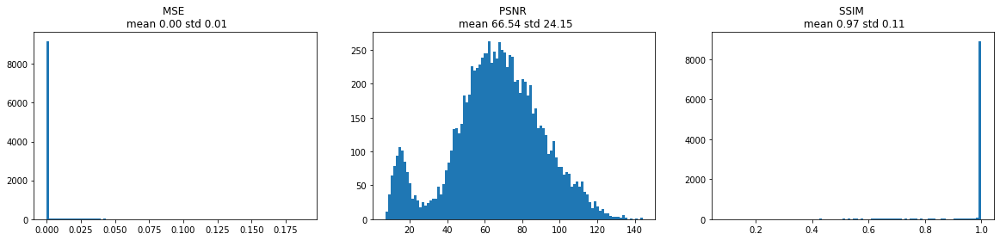

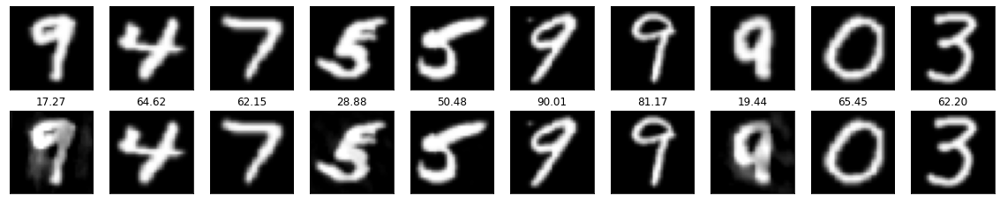

In [5]:
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.348,
                                                                              u_mnist,
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

## EMNIST

100%|██████████| 775/775 [00:09<00:00, 83.22it/s]


mse 0.00
psnr 58.73
ssim 0.98
mean mse 0.00
psnr of mean 29.18
psnr of mean (mean of psnr) 29.18(58.73)


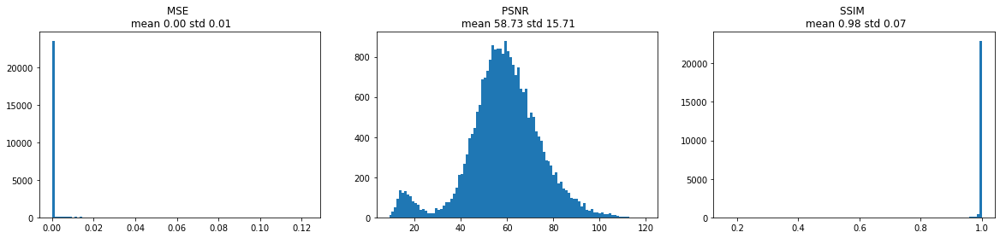

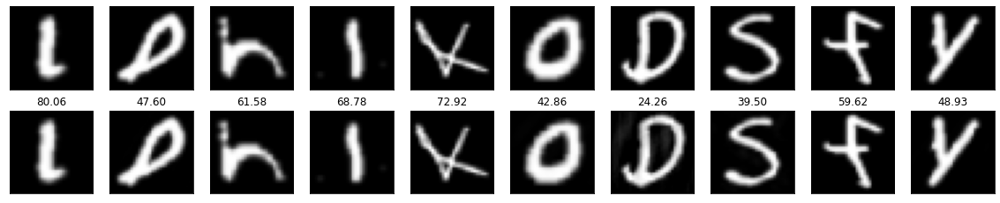

In [6]:
x_test_rec_emnist, mse_list_emnist, psnr_list_emnist, ssim_list_emnist = test_abs(n_test_emnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.01,
                                                                              u_emnist,
                                                                              x_test_emnist)

plot_test(x_test_rec_emnist,
          x_test_emnist,
          mse_list_emnist,
          psnr_list_emnist,
          ssim_list_emnist,
          n_test_emnist,
          plot_n = 10)

## FMNIST

100%|██████████| 313/313 [00:03<00:00, 82.90it/s]


mse 0.00
psnr 57.83
ssim 0.99
mean mse 0.00
psnr of mean 35.79
psnr of mean (mean of psnr) 35.79(57.83)


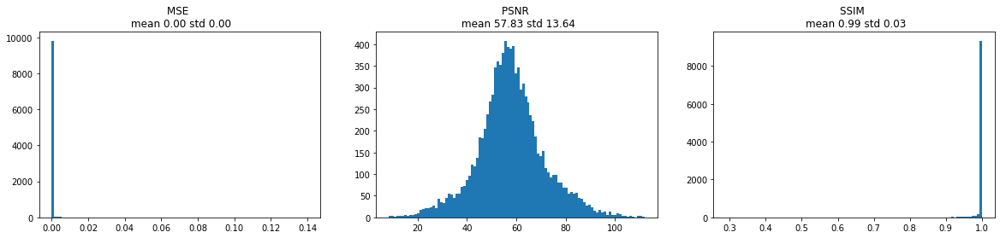

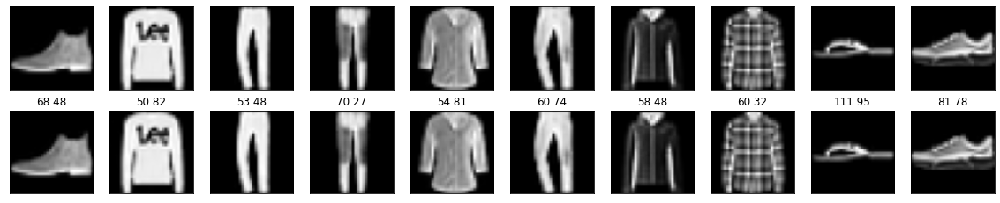

In [7]:
x_test_rec_fmnist, mse_list_fmnist, psnr_list_fmnist, ssim_list_fmnist = test_abs(n_test_fmnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.052, 
                                                                              u_fmnist,
                                                                              x_test_fmnist)

plot_test(x_test_rec_fmnist,
          x_test_fmnist,
          mse_list_fmnist,
          psnr_list_fmnist,
          ssim_list_fmnist,
          n_test_fmnist,
          plot_n = 10)

## SVHN

100%|██████████| 814/814 [00:09<00:00, 83.03it/s]


mse 0.00
psnr 57.50
ssim 1.00
mean mse 0.00
psnr of mean 38.65
psnr of mean (mean of psnr) 38.65(57.50)


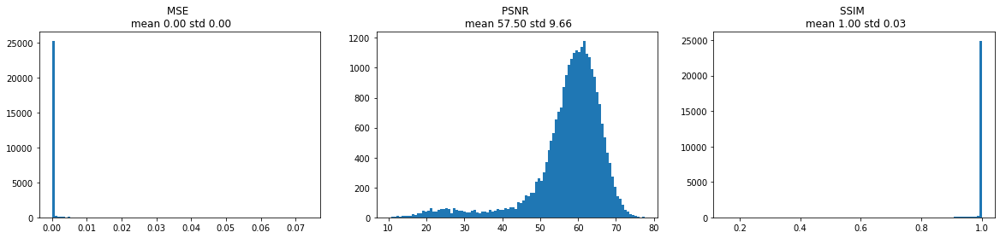

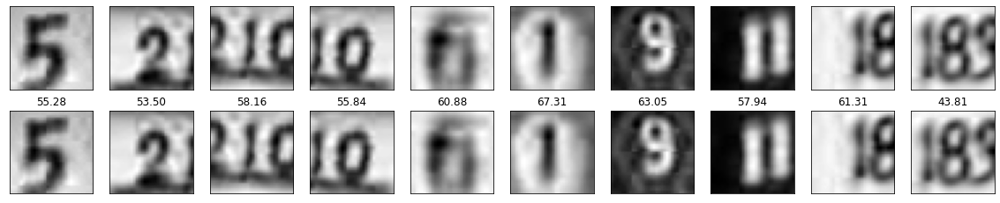

In [8]:
x_test_rec_svhn, mse_list_svhn, psnr_list_svhn, ssim_list_svhn = test_abs(n_test_svhn,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.52,
                                                                              u_svhn,
                                                                              x_test_svhn)

plot_test(x_test_rec_svhn,
          x_test_svhn,
          mse_list_svhn,
          psnr_list_svhn,
          ssim_list_svhn,
          n_test_svhn,
          plot_n = 10)

## CIFAR10

100%|██████████| 313/313 [00:03<00:00, 82.56it/s]


mse 0.00
psnr 41.61
ssim 0.97
mean mse 0.00
psnr of mean 27.36
psnr of mean (mean of psnr) 27.36(41.61)


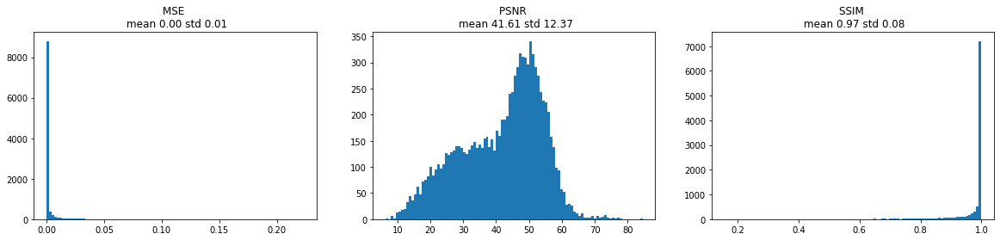

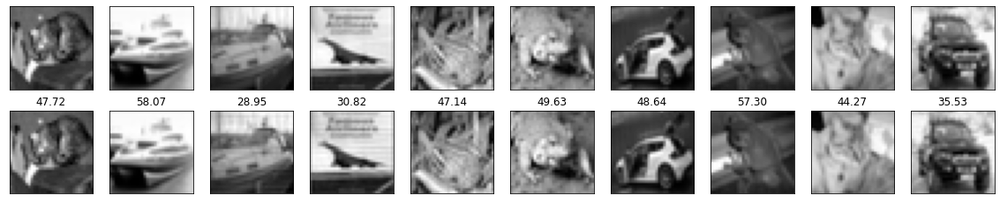

In [9]:
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test_cifar,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.315,
                                                                              u_cifar,
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test_cifar,
          plot_n = 10)

## CelebA

100%|██████████| 32/32 [00:05<00:00,  5.75it/s]


mse 0.00
psnr 39.12
ssim 0.97
mean mse 0.00
psnr of mean 27.48
psnr of mean (mean of psnr) 27.48(39.12)


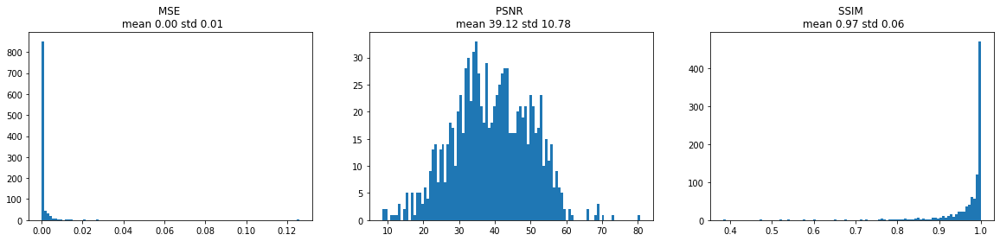

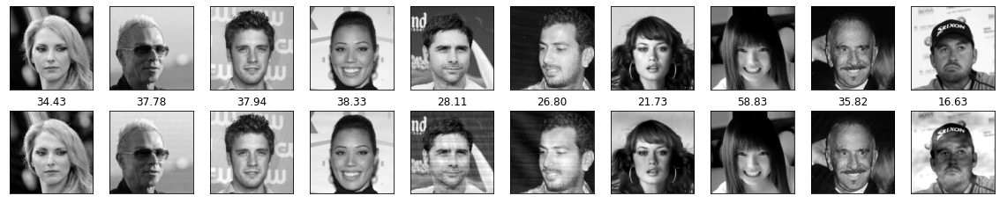

In [10]:
x_test_rec_celeb, mse_list_celeb, psnr_list_celeb, ssim_list_celeb = test_abs(n_test_celeb,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.4,
                                                                              u_celeba,
                                                                              x_test_celeb)

plot_test(x_test_rec_celeb,
          x_test_celeb,
          mse_list_celeb,
          psnr_list_celeb,
          ssim_list_celeb,
          n_test_celeb,
          plot_n = 10)

# 2. Using self-trained referenes

## MNIST

0
best so far 1


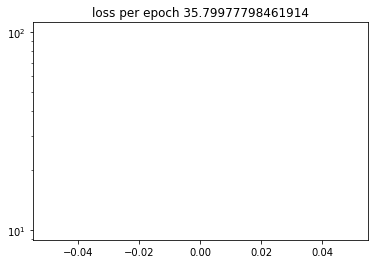

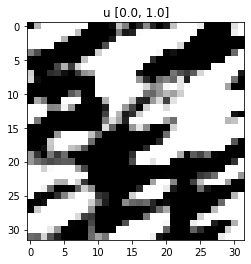

psnr 14.56419587135315
mse 0.03496072068810463


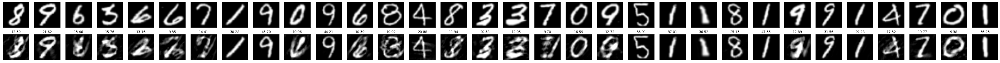

1
best so far 2


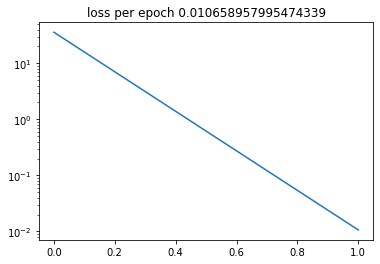

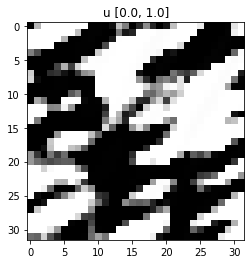

psnr 49.82585430145264
mse 1.0409137757960707e-05


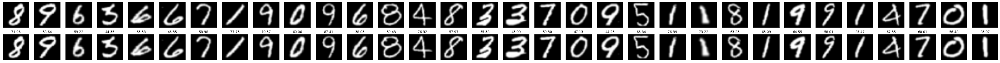

2
best so far 3


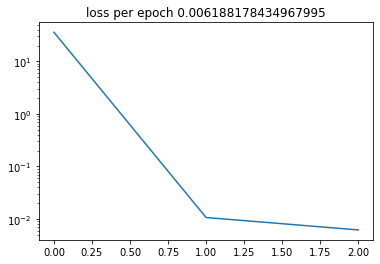

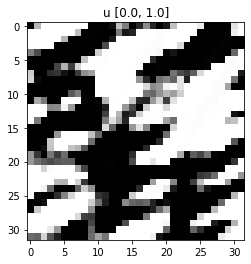

psnr 52.187371253967285
mse 6.043143002898432e-06


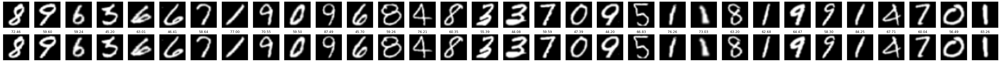

3
best so far 4


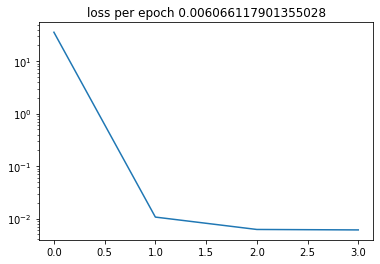

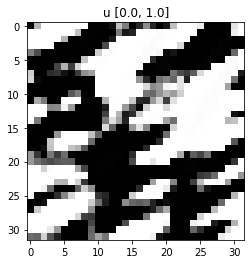

psnr 52.27389335632324
mse 5.923942808294669e-06


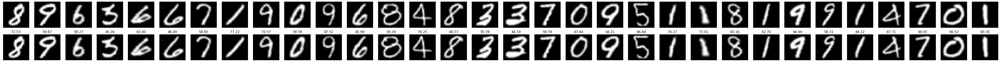

4
best so far 5


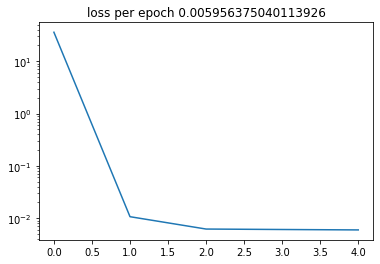

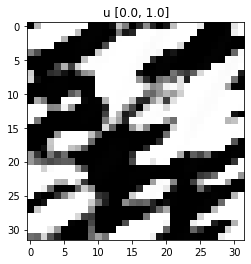

psnr 52.353177070617676
mse 5.816772045363905e-06


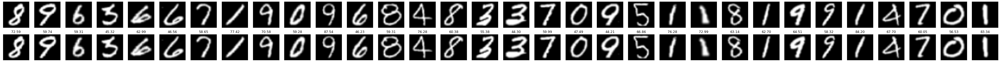

best_epoch 5


In [11]:
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'mnist',x_train_mnist)

In [12]:
path = f'./output_abs/20200202_mnist_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_mnist_32.npy'
u_mnist = np.load(path)

100%|██████████| 313/313 [00:03<00:00, 82.11it/s]


mse 0.00
psnr 66.53
ssim 0.99
mean mse 0.00
psnr of mean 34.09
psnr of mean (mean of psnr) 34.09(66.53)


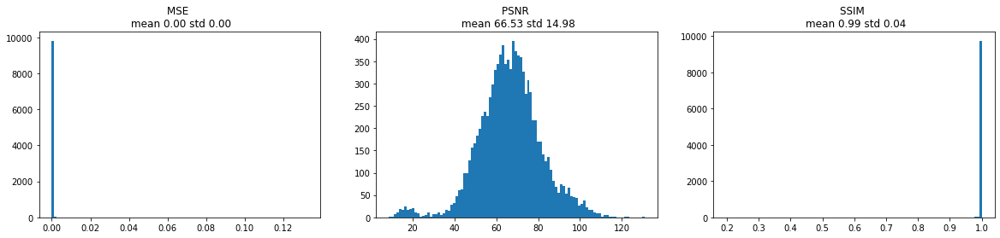

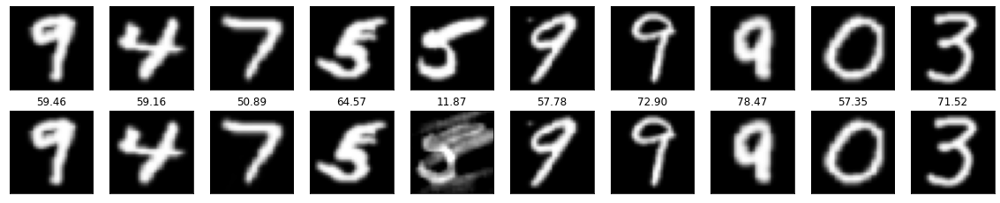

In [13]:
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                      n_batch,
                                                      n_steps,
                                                      1.177,
                                                      u_mnist,
                                                      x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

## EMNIST

0
best so far 1


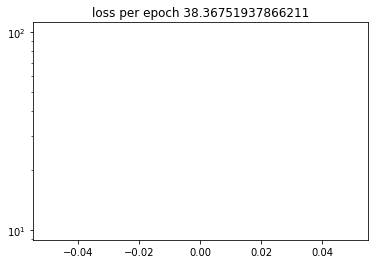

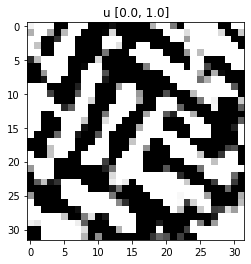

psnr 14.263361692428589
mse 0.037468284368515015


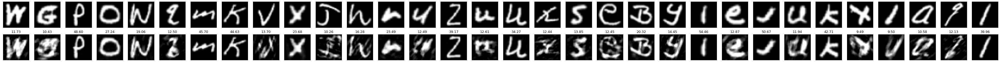

1
best so far 2


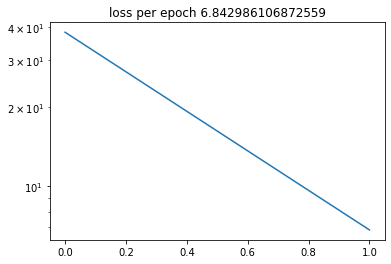

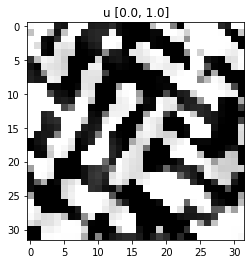

psnr 21.750543117523193
mse 0.006682603619992733


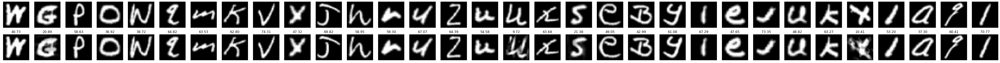

2
best so far 3


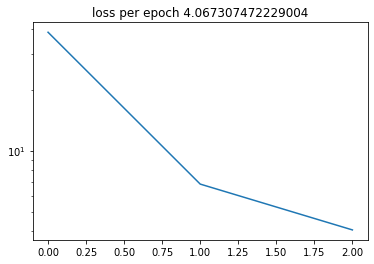

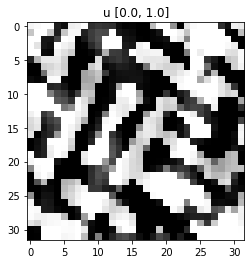

psnr 24.009931087493896
mse 0.003971979487687349


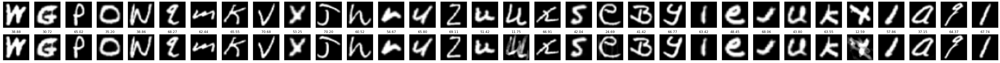

3
best so far 4


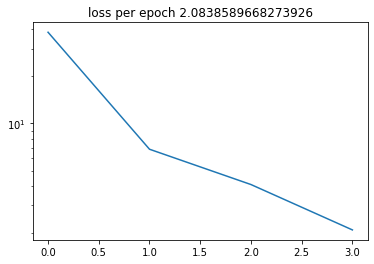

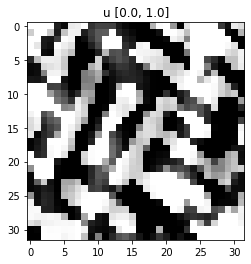

psnr 26.914315223693848
mse 0.0020350185222923756


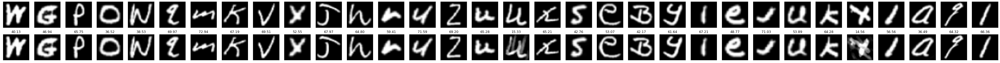

4
best so far 5


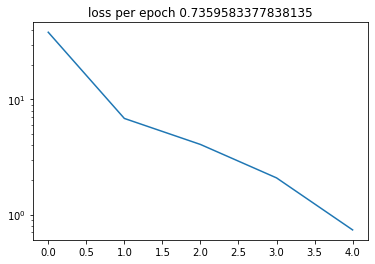

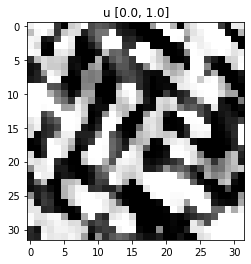

psnr 31.43446683883667
mse 0.0007187092560343444


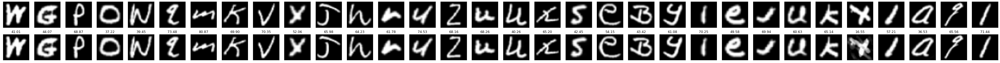

best_epoch 5


In [14]:
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'emnist',x_train_emnist)

In [15]:
path = f'./output_abs/20200202_emnist_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_emnist_32.npy'
u_emnist = np.load(path)

100%|██████████| 775/775 [00:09<00:00, 82.15it/s]


mse 0.00
psnr 58.71
ssim 0.97
mean mse 0.00
psnr of mean 25.55
psnr of mean (mean of psnr) 25.55(58.71)


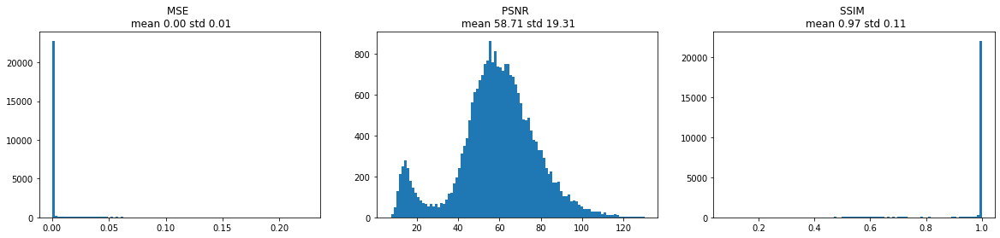

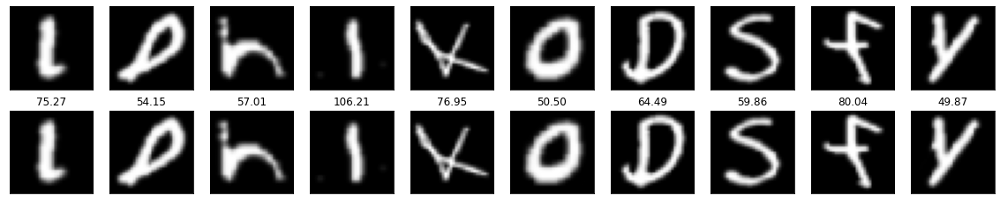

In [16]:
x_test_rec_emnist, mse_list_emnist, psnr_list_emnist, ssim_list_emnist = test_abs(n_test_emnist,
                                                      n_batch,
                                                      n_steps,
                                                      1.16,
                                                      u_emnist,
                                                      x_test_emnist)

plot_test(x_test_rec_emnist,
          x_test_emnist,
          mse_list_emnist,
          psnr_list_emnist,
          ssim_list_emnist,
          n_test_emnist,
          plot_n = 10)

## FMNIST

0
best so far 1


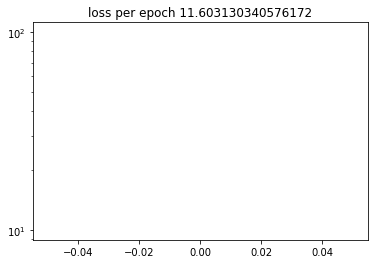

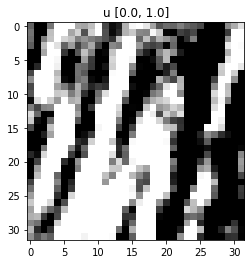

psnr 19.438600540161133
mse 0.011331181973218918


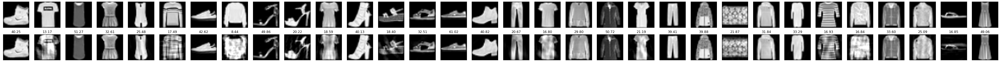

1
best so far 2


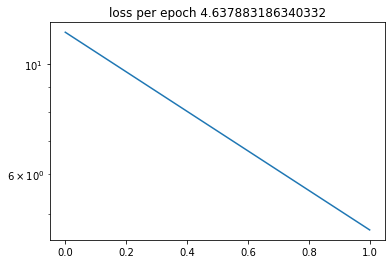

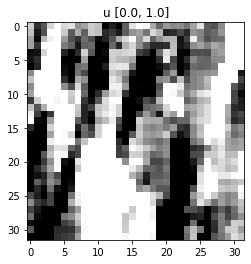

psnr 23.421154022216797
mse 0.004529182333499193


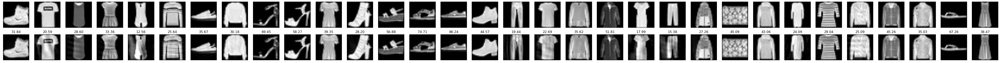

2
best so far 3


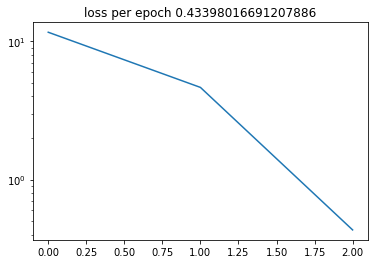

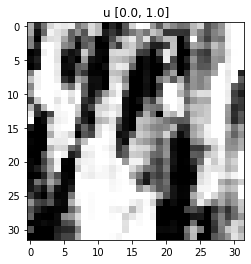

psnr 33.70965242385864
mse 0.000423808756750077


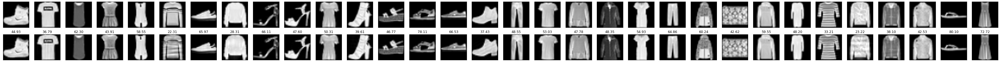

3
best so far 4


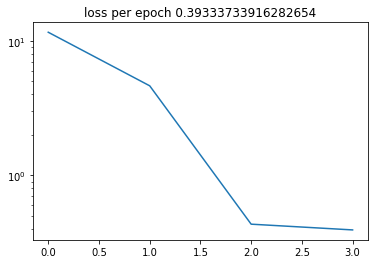

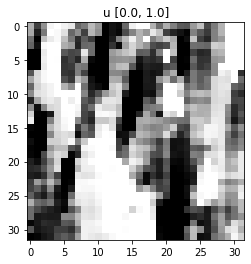

psnr 34.1366982460022
mse 0.00038411852438002825


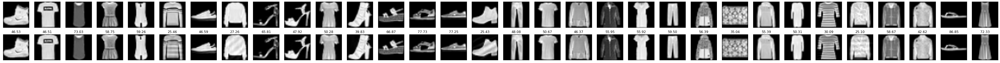

4
best so far 5


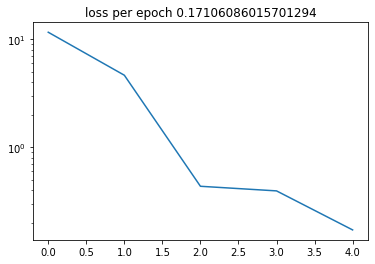

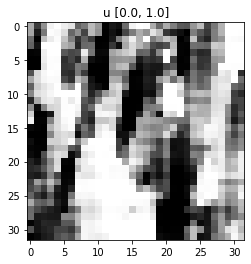

psnr 37.752845287323
mse 0.00016705162124708295


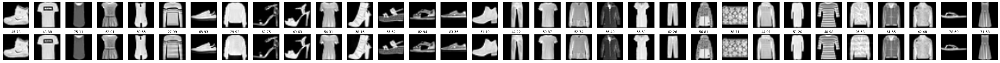

best_epoch 5


In [17]:
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'fmnist',x_train_fmnist)

In [18]:
path = f'./output_abs/20200202_fmnist_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_fmnist_32.npy'
u_fmnist = np.load(path)

100%|██████████| 313/313 [00:03<00:00, 81.97it/s]


mse 0.00
psnr 57.88
ssim 0.98
mean mse 0.00
psnr of mean 30.05
psnr of mean (mean of psnr) 30.05(57.88)


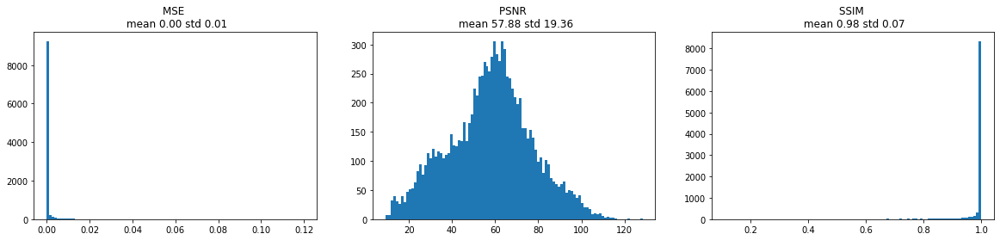

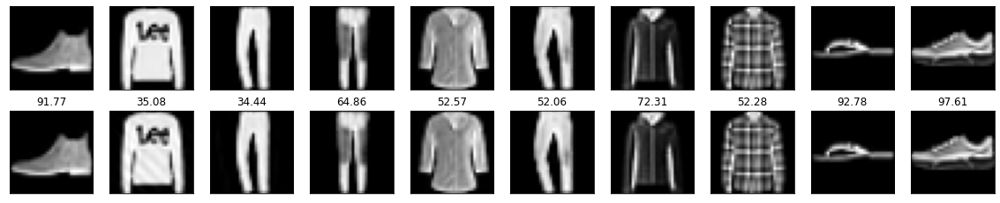

In [19]:
x_test_rec_fmnist, mse_list_fmnist, psnr_list_fmnist, ssim_list_fmnist = test_abs(n_test_fmnist,
                                                      n_batch,
                                                      n_steps,
                                                      1.32, 
                                                      u_fmnist,
                                                      x_test_fmnist)

plot_test(x_test_rec_fmnist,
          x_test_fmnist,
          mse_list_fmnist,
          psnr_list_fmnist,
          ssim_list_fmnist,
          n_test_fmnist,
          plot_n = 10)

## SVHN

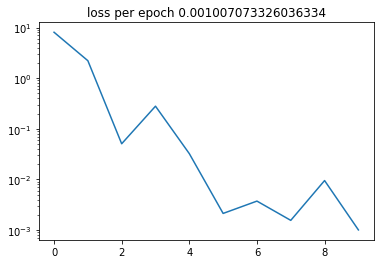

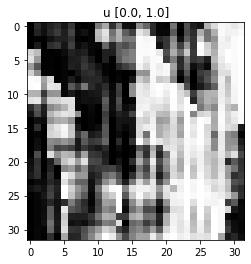

psnr 59.81457710266113
mse 9.834701586441952e-07


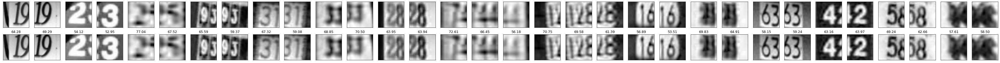

best_epoch 10


In [20]:
alpha = 1.3 
lr_u = 10    
n_epoch = 10
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'svhn',x_train_svhn) 

In [21]:
path = f'./output_abs/20200202_svhn_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_svhn_32.npy'
u_svhn = np.load(path)

100%|██████████| 814/814 [00:09<00:00, 82.25it/s]


mse 0.00
psnr 57.55
ssim 0.99
mean mse 0.00
psnr of mean 36.90
psnr of mean (mean of psnr) 36.90(57.55)


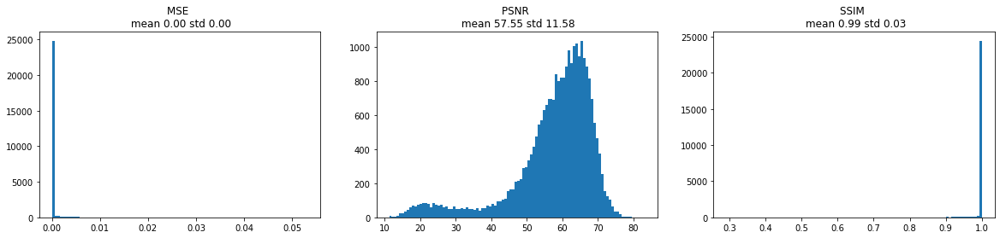

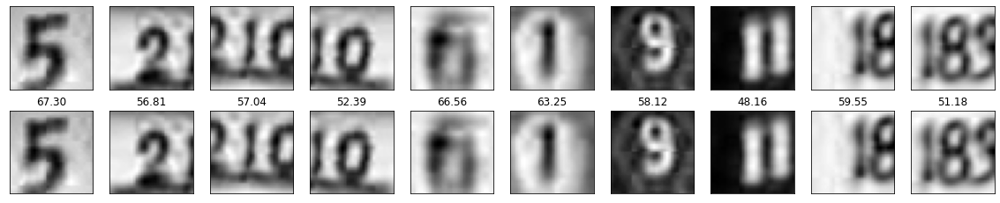

In [22]:
n_test_svhn = len(x_test_svhn)
x_test_rec_svhn, mse_list_svhn, psnr_list_svhn, ssim_list_svhn = test_abs(n_test_svhn,
                                                      n_batch,
                                                      n_steps,
                                                      1.66,
                                                      u_svhn,
                                                      x_test_svhn)

plot_test(x_test_rec_svhn,
          x_test_svhn,
          mse_list_svhn,
          psnr_list_svhn,
          ssim_list_svhn,
          n_test_svhn,
          plot_n = 10)

## CIFAR 10

0
best so far 1


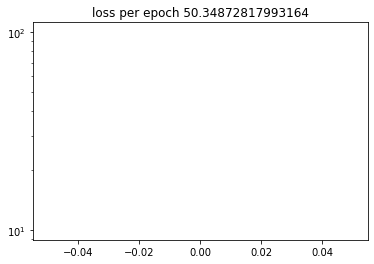

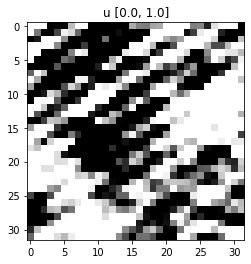

psnr 13.082246780395508
mse 0.049168676137924194


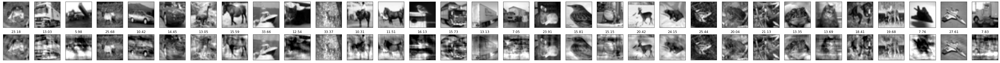

1
best so far 2


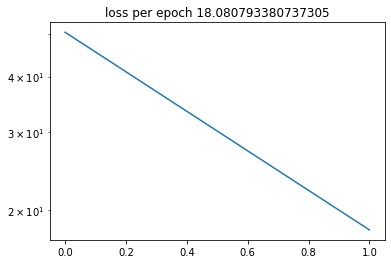

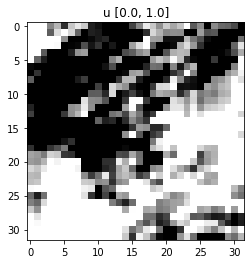

psnr 17.52995729446411
mse 0.017657024785876274


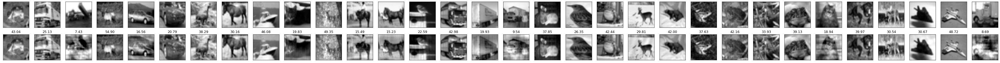

2
best so far 3


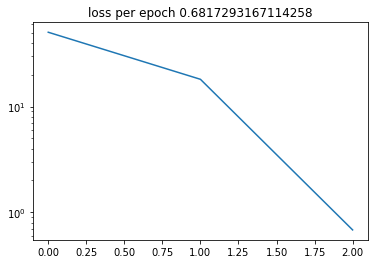

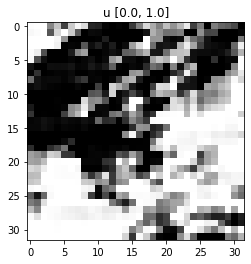

psnr 31.766011714935303
mse 0.0006657512858510017


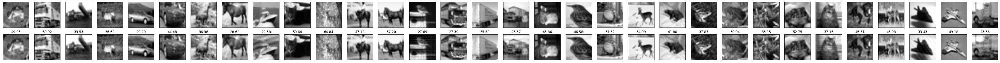

3
best so far 4


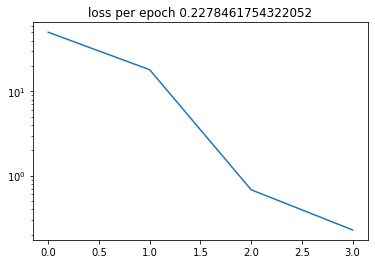

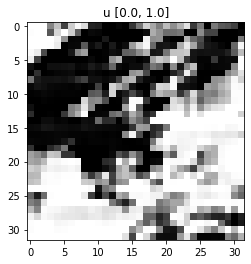

psnr 36.52571201324463
mse 0.00022250604524742812


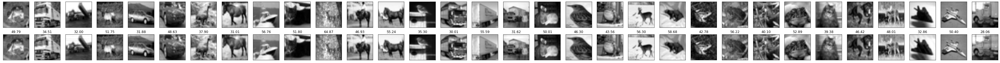

4
best so far 5


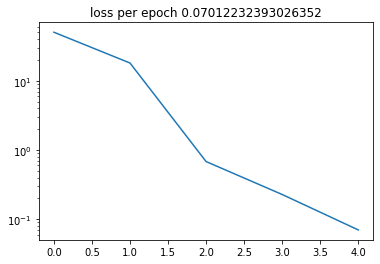

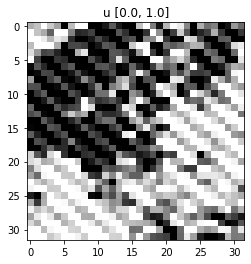

psnr 41.64356708526611
mse 6.847883196314797e-05


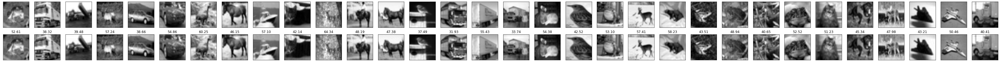

best_epoch 5


In [23]:
n_epoch = 5
lr_u = 1
alpha = 1.3
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'cifar',x_train_cifar)

In [24]:
path = f'./output_abs/20200202_cifar_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_cifar_32.npy'
u_cifar = np.load(path)

100%|██████████| 313/313 [00:03<00:00, 81.86it/s]


mse 0.00
psnr 41.68
ssim 0.97
mean mse 0.00
psnr of mean 28.85
psnr of mean (mean of psnr) 28.85(41.68)


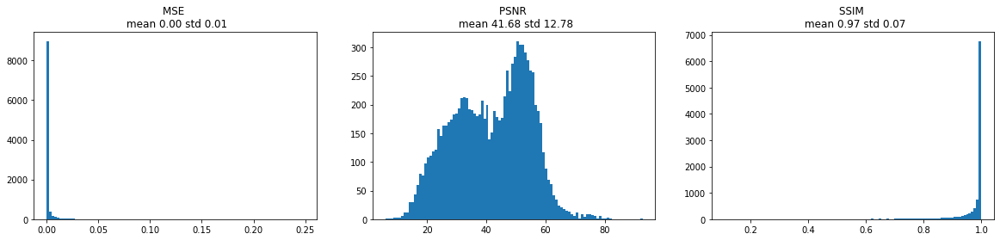

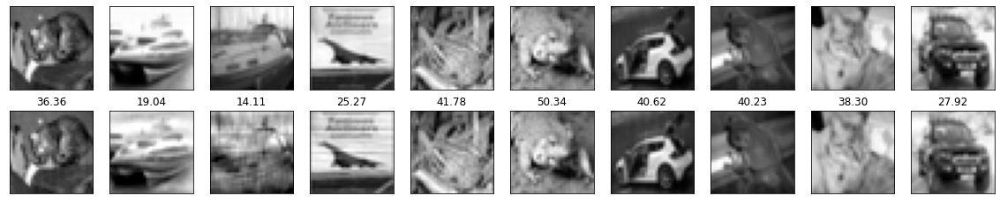

In [25]:
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test_cifar,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.72,
                                                                              u_cifar,
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test_cifar,
          plot_n = 10)

## CELEBA

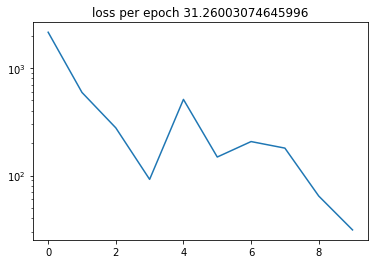

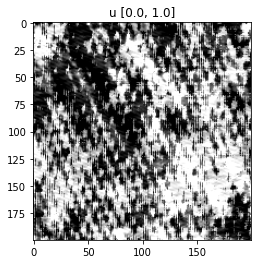

psnr 31.069836616516113
mse 0.0007815008284524083


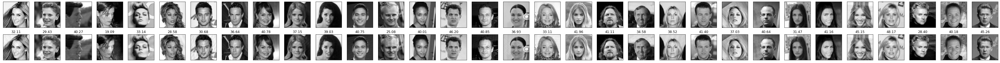

10
best so far 11


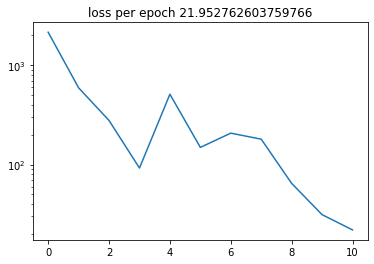

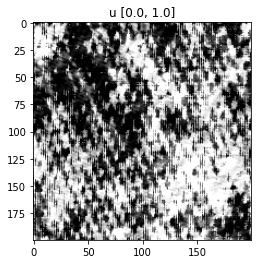

psnr 32.60483980178833
mse 0.0005488191382028162


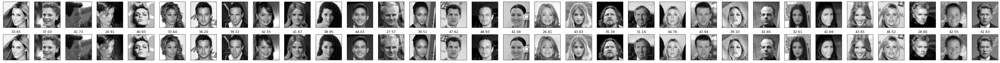

11
best so far 12


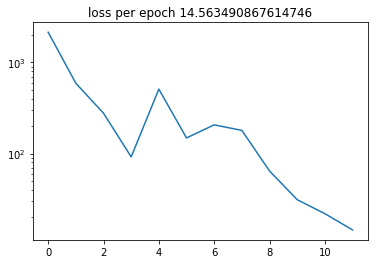

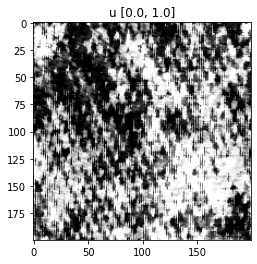

psnr 34.387075901031494
mse 0.0003640872600954026


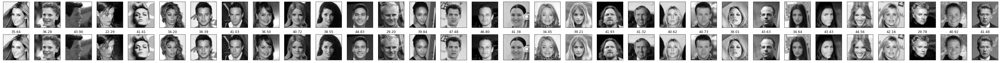

12
best so far 13


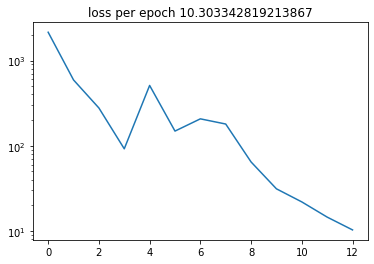

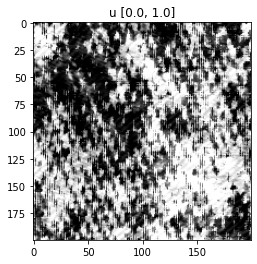

psnr 35.889949798583984
mse 0.00025758365518413484


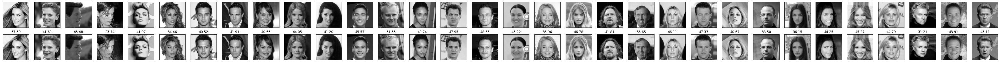

13
best so far 14


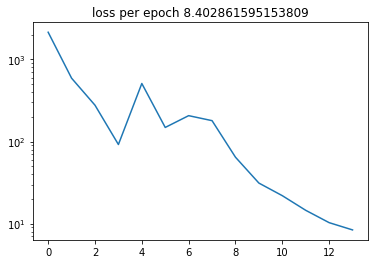

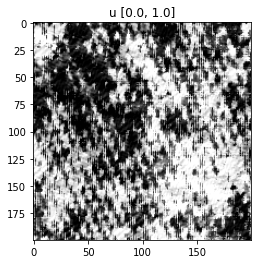

psnr 36.77545785903931
mse 0.0002100715646520257


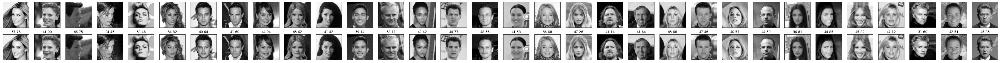

14
best so far 15


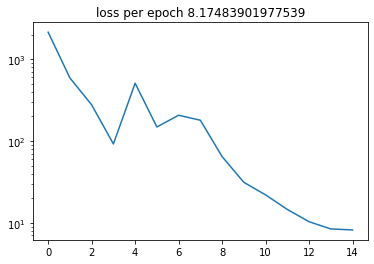

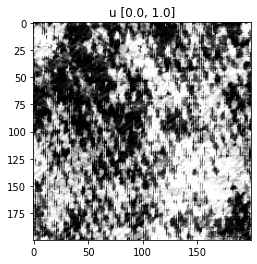

psnr 36.894938945770264
mse 0.00020437095372471958


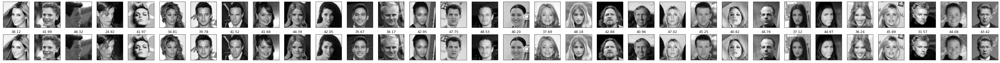

best_epoch 15


In [27]:
n_epoch = 15
alpha = 1
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'celeb',x_train_celeb)

In [28]:
path = f'./output_abs/20200202_celeb_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_celeb_32.npy'
u_celeb = np.load(path)

100%|██████████| 32/32 [00:05<00:00,  5.74it/s]


mse 0.00
psnr 39.06
ssim 0.97
mean mse 0.00
psnr of mean 27.12
psnr of mean (mean of psnr) 27.12(39.06)


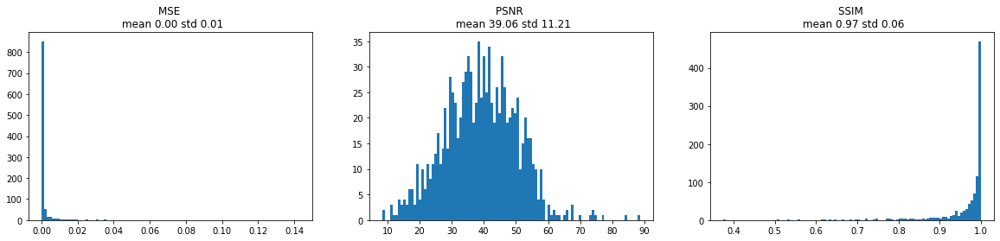

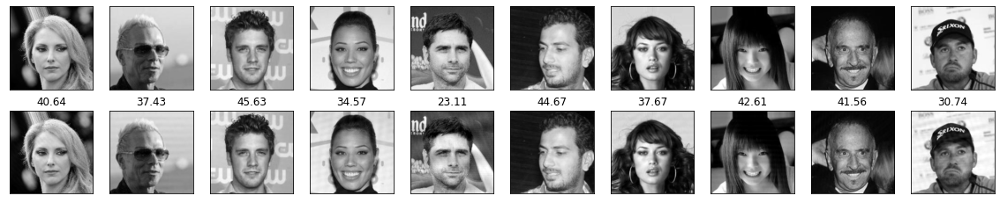

In [33]:
x_test_rec_celeb, mse_list_celeb, psnr_list_celeb, ssim_list_celeb = test_abs(n_test_celeb,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.87, 
                                                                              u_celeb,
                                                                              x_test_celeb)

plot_test(x_test_rec_celeb,
          x_test_celeb,
          mse_list_celeb,
          psnr_list_celeb,
          ssim_list_celeb,
          n_test_celeb,
          plot_n = 10)